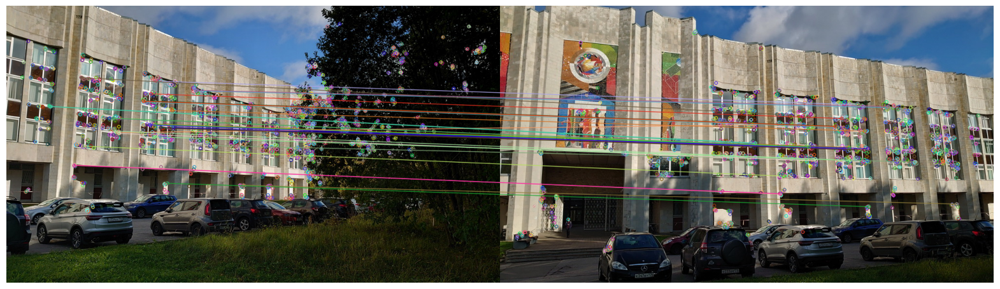

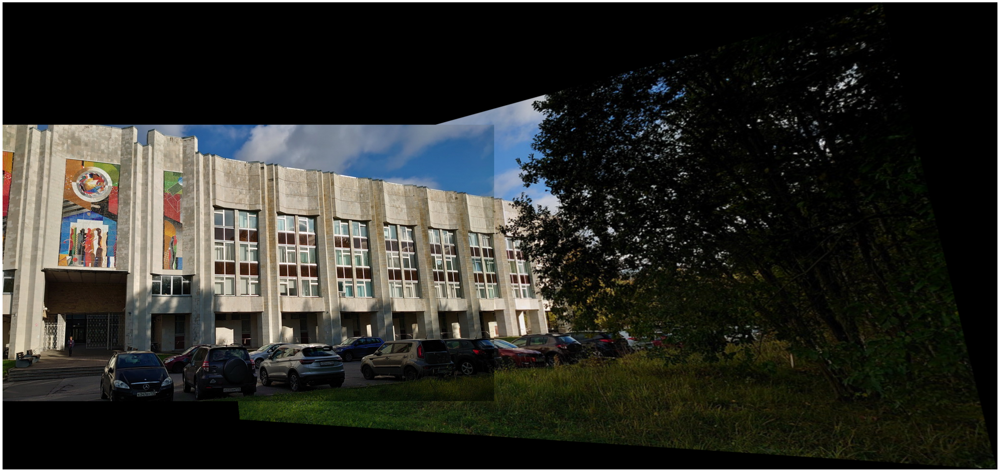

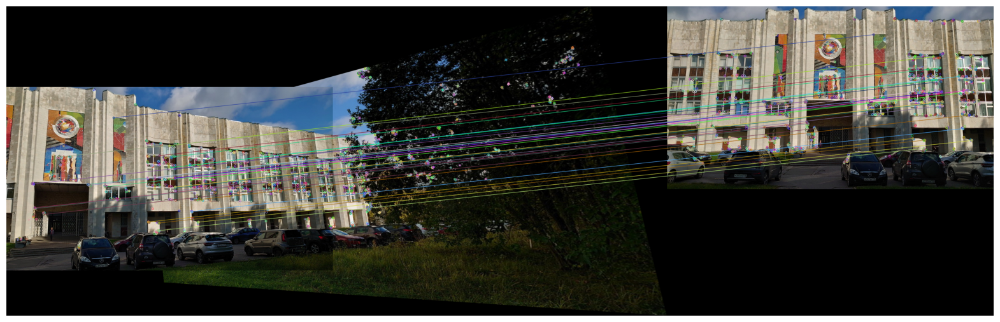

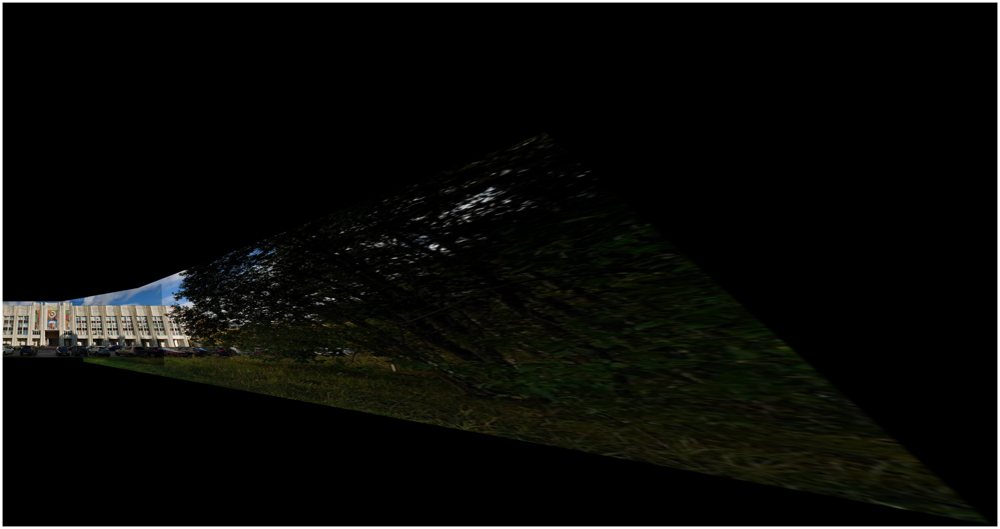

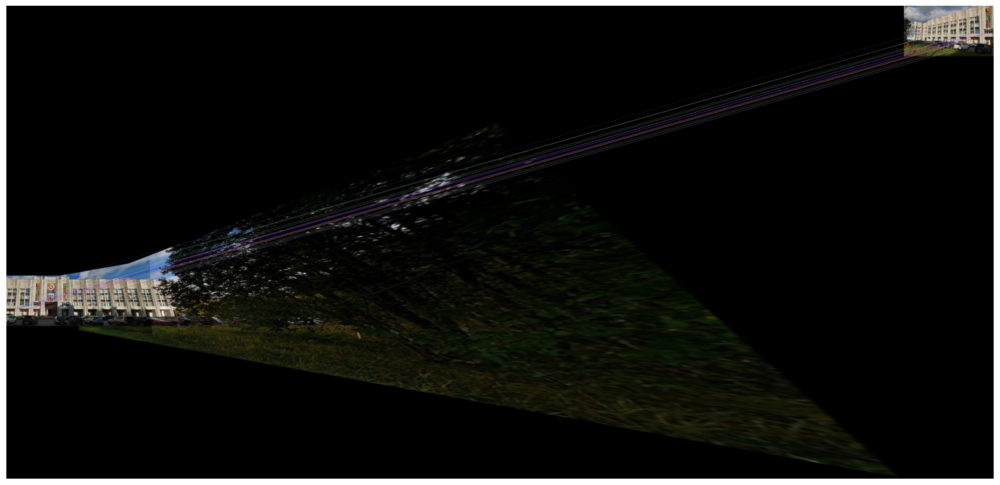

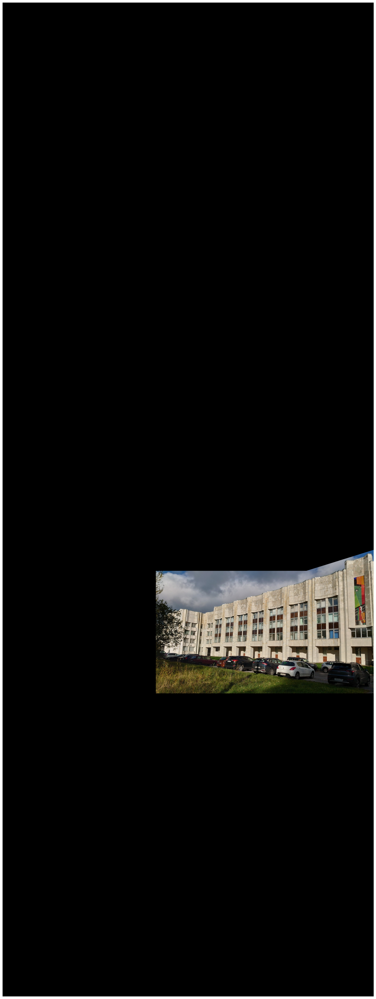

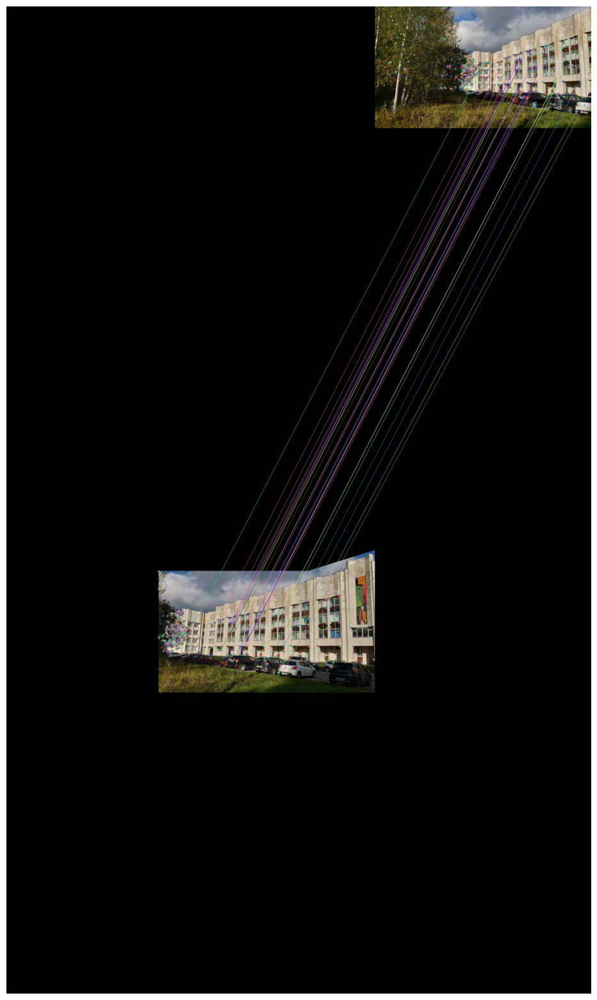

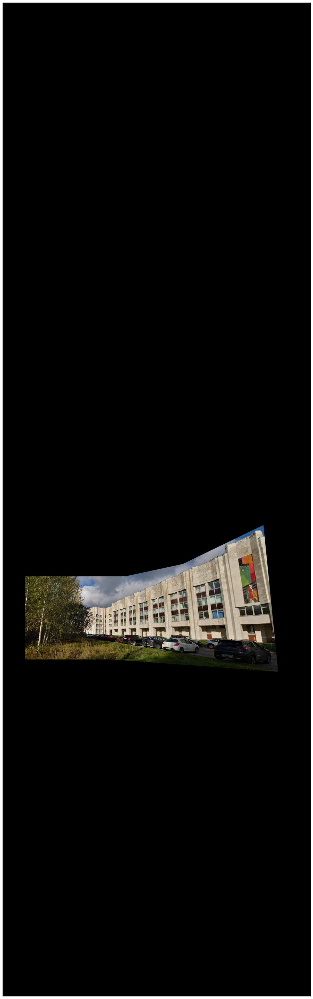

True

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def warpImages(img1, img2, H):
    rows1, cols1 = img1.shape[:2]
    rows2, cols2 = img2.shape[:2]

    list_of_points_1 = np.float32([[0, 0], [0, rows1], [cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
    temp_points = np.float32([[0, 0], [0, rows2], [cols2, rows2], [cols2, 0]]).reshape(-1, 1, 2)

    list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

    list_of_points = np.concatenate((list_of_points_1, list_of_points_2), axis=0)

    [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

    translation_dist = [-x_min, -y_min]

    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

    output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max - x_min, y_max - y_min))
    output_img[translation_dist[1]:rows1 + translation_dist[1], translation_dist[0]:cols1 + translation_dist[0]] = img1

    return output_img

# Read all images
images = [cv2.imread("building2/dsc_2707.jpg"), cv2.imread("building2/dsc_2708.jpg"), cv2.imread("building2/dsc_2709.jpg"), cv2.imread("building2/dsc_2710.jpg"), cv2.imread("building2/dsc_2711.jpg")]

# Initialize the panorama as the first image
panorama2 = images[0]

# Iterate through the rest of the images
for i in range(1, len(images)):
    # Use ORB feature detector to find keypoints and descriptors
    orb = cv2.ORB_create(nfeatures=2000)
    kp1, des1 = orb.detectAndCompute(panorama2, None)
    kp2, des2 = orb.detectAndCompute(images[i], None)

    # Create a BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # Match descriptors
    matches = bf.match(des1, des2)

    # Sort them in ascending order of distance
    matches = sorted(matches, key=lambda x: x.distance)

    # Draw the first 30 matches
    img3 = cv2.drawMatches(panorama2, kp1, images[i], kp2, matches[:30], outImg=None)
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Define a minimum number of good matches required for successful stitching
    MIN_MATCH_COUNT = 10

    if len(matches) > MIN_MATCH_COUNT:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        # Calculate the homography matrix using RANSAC
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        # Warp the current image to the panorama
        result = warpImages(images[i], panorama2, M)

        # Show the result
        plt.figure(figsize=(50, 50))
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Update the panorama and accumulated transform
        panorama2 = result

cv2.imwrite("panorama2.jpg", panorama2)
